In [1]:
import sys
sys.path.insert(0, '/home/ading/dev/empirical-mt')

import matplotlib.pyplot as plt

from pelic.gabors import makeGabors, makeGaussian
from pelic.calculate_contrast import CalculateContrast

import pandas as pd

from tqdm import tqdm 

from tuning import DirectionTuning, SpeedTuning, DisparityTuning

import numpy as np

from skimage import io
from skimage.color import rgb2gray, gray2rgb
from skimage.transform import resize
import skimage.draw as draw

import scipy.io as sio

import MT

from keras.layers import Input, Dense, Concatenate, Multiply
from keras.models import Model

size_ = 101
gabors = makeGabors(size_, center=None)
gaussian = makeGaussian(size_, sigma=5, center=None)

contrast_calculator = CalculateContrast(gabors, gaussian)

import tensorflow as tf

from os import listdir
from os.path import isfile, join, split, isdir, basename

/usr/local/lib/python2.7/dist-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


Instructions for updating:
keep_dims is deprecated, use keepdims instead


In [54]:
video_dir_path = 'input/ALOV300++/imagedata++'
ground_dir_truth = 'input/ALOV300++/alov300++_rectangleAnnotation_full'

In [56]:
video_paths = []

for cat_dir_path in listdir(join('../', video_dir_path)):
    for video_path in listdir(join('../', video_dir_path, cat_dir_path)):
        video_path = join(video_dir_path, cat_dir_path, video_path)
        video_paths.append(video_path)


In [80]:
alov300_df = pd.DataFrame({'video_path': video_paths})

In [81]:
split(video_paths[0])[1].split('-')[1].split('_')[0].lower()

'transparency'

In [82]:
video_paths[0]

'input/ALOV300++/imagedata++/04-Transparency/04-Transparency_video00001'

In [83]:
alov300_df['category'] = alov300_df['video_path'].map(lambda p: split(p)[1].split('-')[1].split('_')[0].lower())

In [84]:
alov300_df[['category']].drop_duplicates()

,category
0,transparency
20,movingcamera
42,motionsmoothness
64,specularity
82,longduration
92,lowcontrast
115,zoomingcamera
144,surfacecover
159,clutter
174,occlusion


In [85]:
alov300_df['ground_truth_path'] = alov300_df['video_path'].map(lambda p: p.replace('imagedata++', 'alov300++_rectangleAnnotation_full') + '.ann')

In [86]:
alov300_df['ground_truth_path'][0]

'input/ALOV300++/alov300++_rectangleAnnotation_full/04-Transparency/04-Transparency_video00001.ann'

In [87]:
alov300_df.head()

,video_path,category,ground_truth_path
0,input/ALOV300++/imagedata++/04-Transparency/04...,transparency,input/ALOV300++/alov300++_rectangleAnnotation_...
1,input/ALOV300++/imagedata++/04-Transparency/04...,transparency,input/ALOV300++/alov300++_rectangleAnnotation_...
2,input/ALOV300++/imagedata++/04-Transparency/04...,transparency,input/ALOV300++/alov300++_rectangleAnnotation_...
3,input/ALOV300++/imagedata++/04-Transparency/04...,transparency,input/ALOV300++/alov300++_rectangleAnnotation_...
4,input/ALOV300++/imagedata++/04-Transparency/04...,transparency,input/ALOV300++/alov300++_rectangleAnnotation_...


In [88]:
def get_resol(p):
    f1 = io.imread(join('../', p, '00000001.jpg'))
    f_num = len(listdir(join('../', p)))
    return f1.shape[0:2] + (f_num, )

In [89]:
alov300_df['size'] = alov300_df['video_path'].map(get_resol)

In [90]:
alov300_df['size_x'] = alov300_df['size'].map(lambda s: s[0])
alov300_df['size_y'] = alov300_df['size'].map(lambda s: s[1])
alov300_df['size_z'] = alov300_df['size'].map(lambda s: s[2])

In [91]:
alov300_df = alov300_df.sort_values(by='video_path')

In [93]:
alov300_df.to_csv('../data/alov300++/alov300.csv', index=False, columns=['video_path', 'category', 'ground_truth_path', 'size_x', 'size_y', 'size_z'])

In [94]:
alov300_df = pd.read_csv('../data/alov300++/alov300.csv')

In [95]:
alov300_df.head()

,video_path,category,ground_truth_path,size_x,size_y,size_z
0,input/ALOV300++/imagedata++/01-Light/01-Light_...,light,input/ALOV300++/alov300++_rectangleAnnotation_...,720,1280,356
1,input/ALOV300++/imagedata++/01-Light/01-Light_...,light,input/ALOV300++/alov300++_rectangleAnnotation_...,718,1280,114
2,input/ALOV300++/imagedata++/01-Light/01-Light_...,light,input/ALOV300++/alov300++_rectangleAnnotation_...,718,1280,186
3,input/ALOV300++/imagedata++/01-Light/01-Light_...,light,input/ALOV300++/alov300++_rectangleAnnotation_...,718,1280,120
4,input/ALOV300++/imagedata++/01-Light/01-Light_...,light,input/ALOV300++/alov300++_rectangleAnnotation_...,1080,1920,360


In [97]:
alov300_df['resol'] = alov300_df.apply(lambda r: (r['size_x'], r['size_y']), axis=1)

In [98]:
alov300_df['resol']

0       (720, 1280)
1       (718, 1280)
2       (718, 1280)
3       (718, 1280)
4      (1080, 1920)
5        (360, 480)
6        (480, 720)
7      (1080, 1920)
8       (544, 1280)
9        (576, 768)
10       (576, 720)
11       (480, 640)
12       (480, 640)
13       (360, 480)
14       (240, 320)
15       (240, 320)
16       (480, 640)
17      (720, 1280)
18       (480, 640)
19       (480, 640)
20       (240, 320)
21       (480, 360)
22       (360, 480)
23       (576, 720)
24       (360, 640)
25       (360, 640)
26      (720, 1280)
27      (720, 1280)
28       (480, 640)
29      (720, 1280)
           ...     
284      (480, 854)
285      (480, 848)
286      (480, 640)
287    (1080, 1920)
288      (480, 854)
289    (1080, 1920)
290    (1080, 1920)
291    (1080, 1920)
292    (1080, 1920)
293    (1080, 1920)
294    (1080, 1920)
295     (720, 1280)
296      (480, 640)
297      (576, 720)
298     (720, 1280)
299    (1080, 1920)
300      (480, 854)
301      (480, 854)
302      (576, 704)


In [99]:
alov300_df['resol'].value_counts()

#plt.show()

(720, 1280)     93
(1080, 1920)    66
(480, 640)      22
(360, 480)      19
(576, 720)      18
(480, 854)      14
(240, 320)      13
(544, 1280)      9
(576, 704)       8
(360, 640)       7
(576, 768)       7
(718, 1280)      5
(720, 960)       5
(288, 352)       3
(480, 720)       2
(540, 1280)      2
(1080, 1440)     2
(1080, 1906)     2
(240, 352)       2
(720, 900)       1
(692, 1280)      1
(360, 540)       1
(282, 502)       1
(404, 720)       1
(240, 640)       1
(420, 560)       1
(480, 360)       1
(144, 192)       1
(217, 290)       1
(480, 848)       1
(270, 480)       1
(300, 400)       1
(310, 470)       1
(2160, 3840)     1
Name: resol, dtype: int64

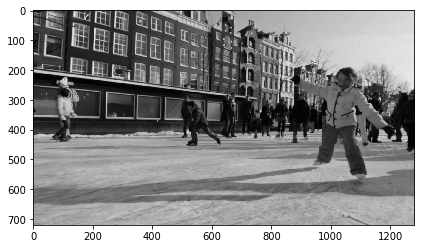

In [195]:
f1 = io.imread(join('../', alov300_df['video_path'][0], '00000001.jpg'))
f1 = rgb2gray(f1)

io.imshow(f1)

plt.show()

In [ ]:
f1 = transform

In [132]:
def parse_line(l):
    vs = map(float, l['line'].split(' '))
    frame_id = int(vs[0])
    
    v1 = (vs[1], vs[2])
    v2 = (vs[3], vs[4])
    v3 = (vs[5], vs[6])
    v4 = (vs[7], vs[8])
            
    return pd.Series({'frame_id': frame_id, 'v1': v1, 'v2': v2, 'v3': v3, 'v4':v4})
    

In [130]:
range(1, 9, 2)

[1, 3, 5, 7]

In [193]:
bound_box = pd.read_csv(join('../', alov300_df['ground_truth_path'][0]), header=None, names=['line'])

bound_box = bound_box.apply(parse_line, axis=1)

In [2]:
"%010d" % 3

'0000000003'

In [194]:
bound_box.set_index('frame_id', inplace=False, drop=False)

,frame_id,v1,v2,v3,v4
frame_id,,,,,
1,1,"(1080.2, 187.84)","(1012.9, 187.84)","(1012.9, 269.56)","(1080.2, 269.56)"
6,6,"(1107.1, 175.43)","(1039.8, 175.43)","(1039.8, 257.15)","(1107.1, 257.15)"
11,11,"(1088.5, 167.16)","(1021.2, 167.16)","(1021.2, 248.88)","(1088.5, 248.88)"
16,16,"(1034.7, 177.5)","(967.41, 177.5)","(967.41, 259.22)","(1034.7, 259.22)"
21,21,"(987.15, 185.77)","(919.85, 185.77)","(919.85, 267.49)","(987.15, 267.49)"
26,26,"(945.79, 191.98)","(878.49, 191.98)","(878.49, 273.7)","(945.79, 273.7)"
31,31,"(929.25, 173.37)","(859.88, 173.37)","(859.88, 261.29)","(929.25, 261.29)"
36,36,"(925.11, 146.48)","(855.74, 146.48)","(855.74, 234.41)","(925.11, 234.41)"
41,41,"(927.18, 96.855)","(847.47, 96.855)","(847.47, 199.25)","(927.18, 199.25)"


In [158]:
bound_box

,frame_id,v1,v2,v3,v4
0,1,"(1080.2, 187.84)","(1012.9, 187.84)","(1012.9, 269.56)","(1080.2, 269.56)"
1,6,"(1107.1, 175.43)","(1039.8, 175.43)","(1039.8, 257.15)","(1107.1, 257.15)"
2,11,"(1088.5, 167.16)","(1021.2, 167.16)","(1021.2, 248.88)","(1088.5, 248.88)"
3,16,"(1034.7, 177.5)","(967.41, 177.5)","(967.41, 259.22)","(1034.7, 259.22)"
4,21,"(987.15, 185.77)","(919.85, 185.77)","(919.85, 267.49)","(987.15, 267.49)"
5,26,"(945.79, 191.98)","(878.49, 191.98)","(878.49, 273.7)","(945.79, 273.7)"
6,31,"(929.25, 173.37)","(859.88, 173.37)","(859.88, 261.29)","(929.25, 261.29)"
7,36,"(925.11, 146.48)","(855.74, 146.48)","(855.74, 234.41)","(925.11, 234.41)"
8,41,"(927.18, 96.855)","(847.47, 96.855)","(847.47, 199.25)","(927.18, 199.25)"
9,46,"(920.98, 86.515)","(841.27, 86.515)","(841.27, 188.91)","(920.98, 188.91)"


In [178]:
s = pd.read_json('../data/alov300++/ground_truth/01-Light_video00001.ann')


In [184]:
s.index

Int64Index([1, 11, 16, 21, 26, 31, 36, 41, 46, 51, 56, 6, 61, 66, 71, 76, 81,
            86, 91],
           dtype='int64')

In [177]:
s.loc[1]

v1    [188, 1080]
v2    [188, 1013]
v3    [270, 1013]
v4    [270, 1080]
Name: 1, dtype: object

In [149]:
np.flip(np.round((3, 4.7)), axis=0)

array([ 5.,  3.])

In [160]:
basename('daf/dfdf/da')

'da'

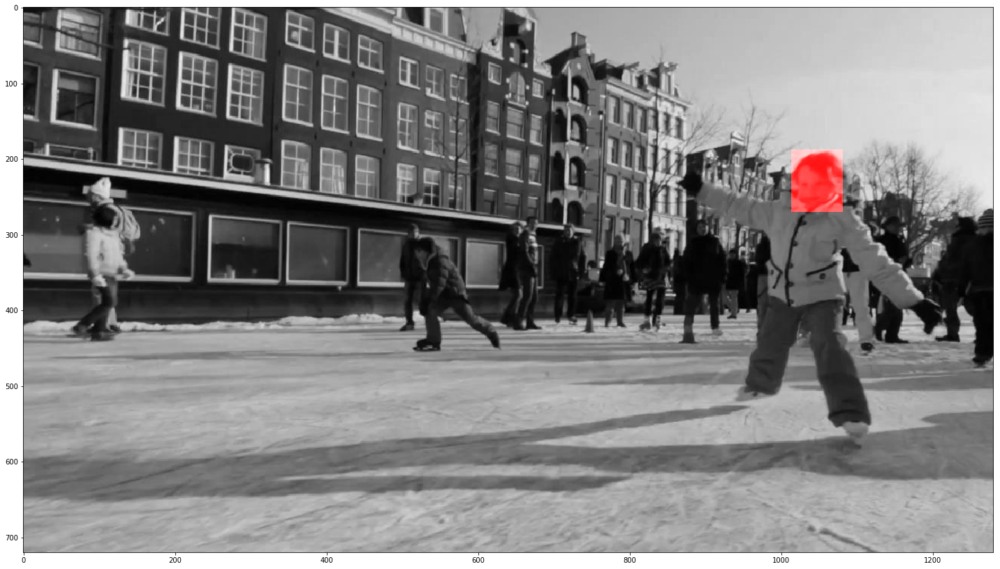

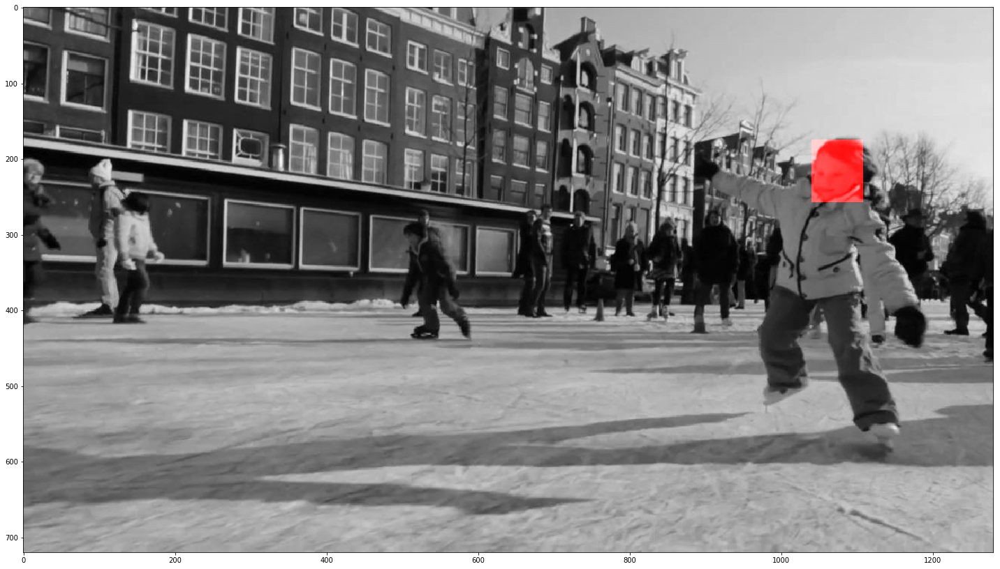

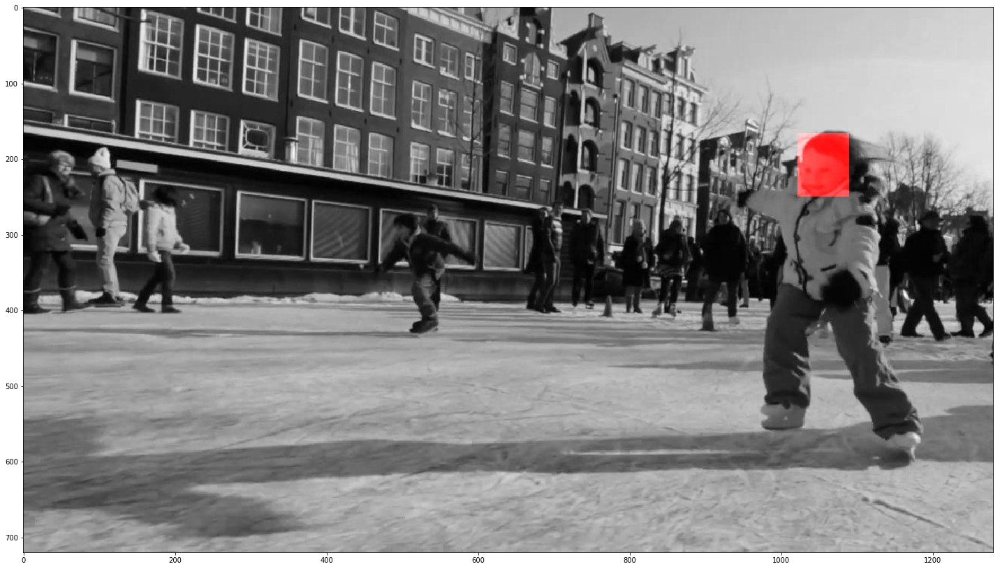

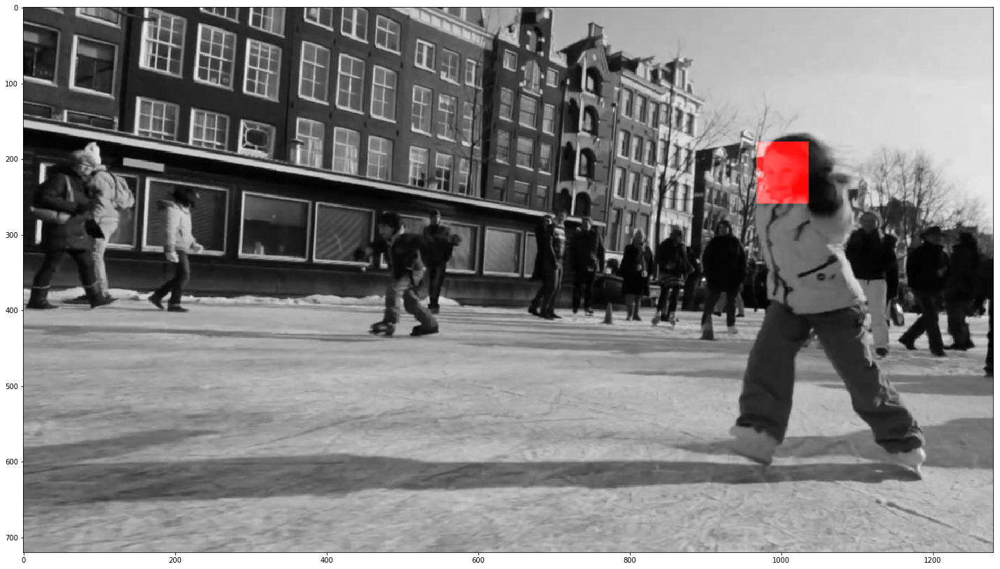

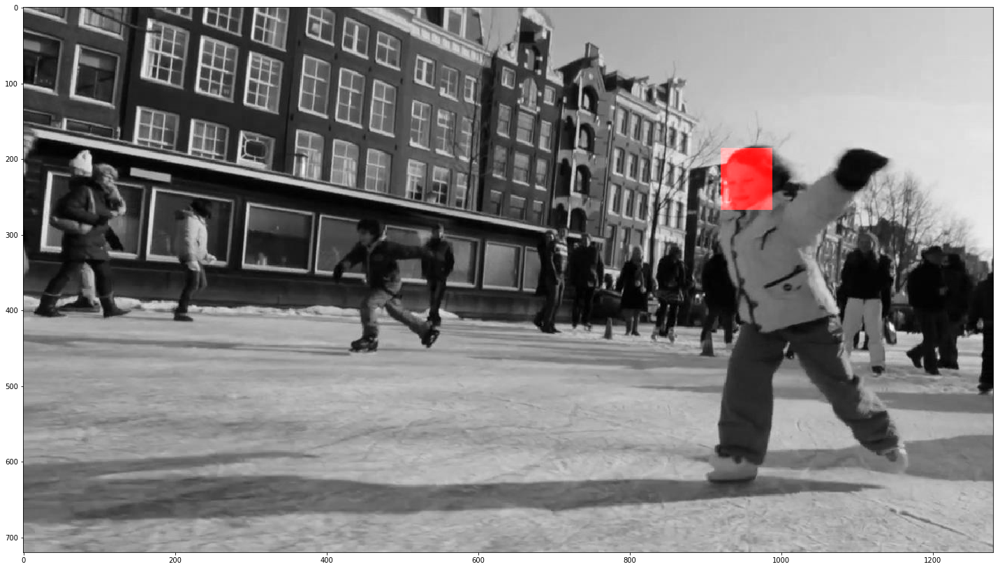

...

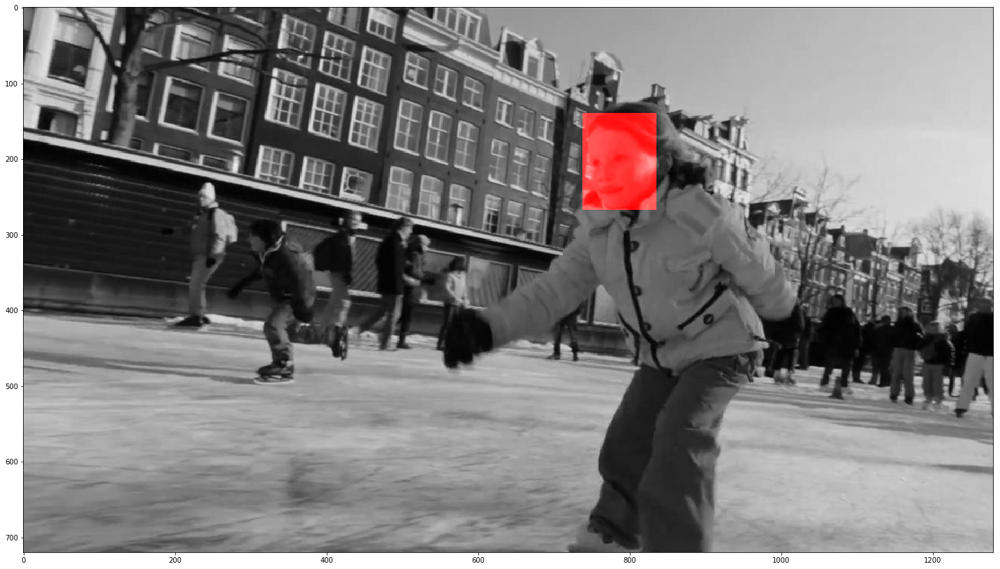

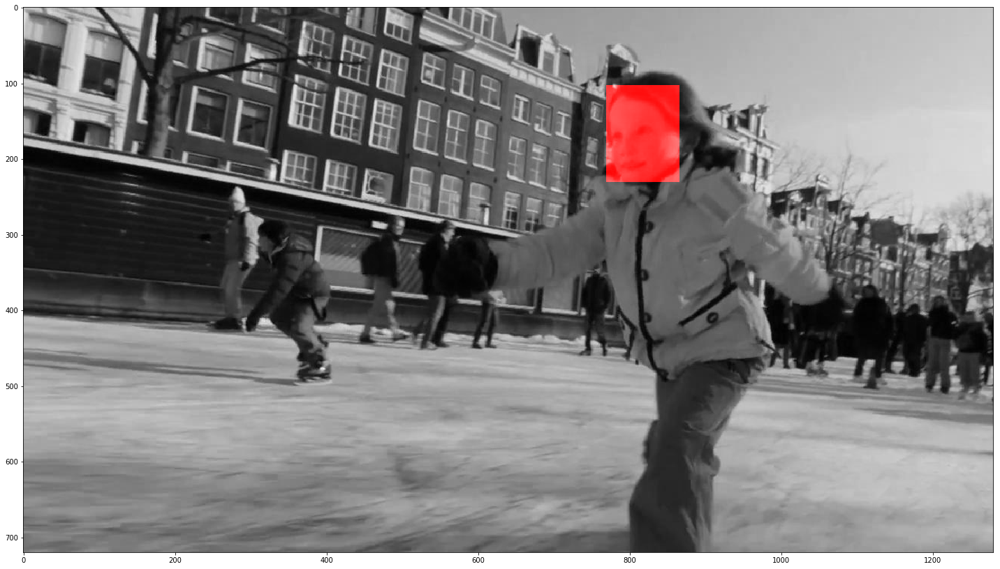

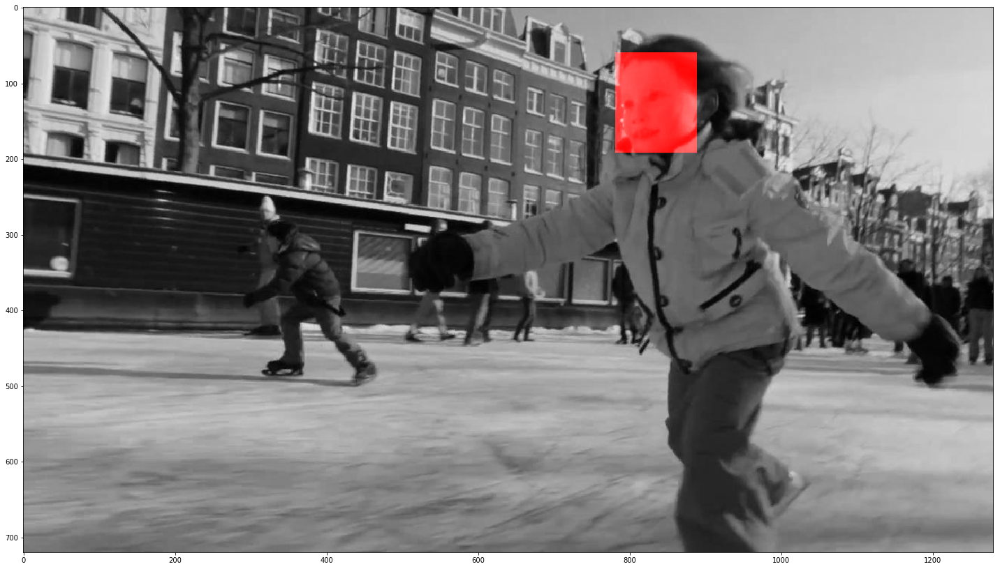

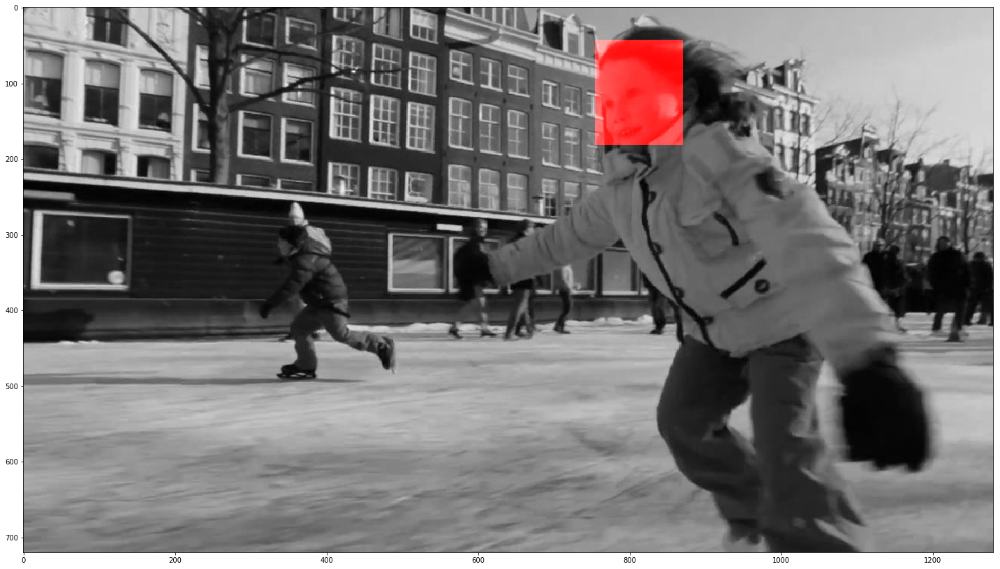

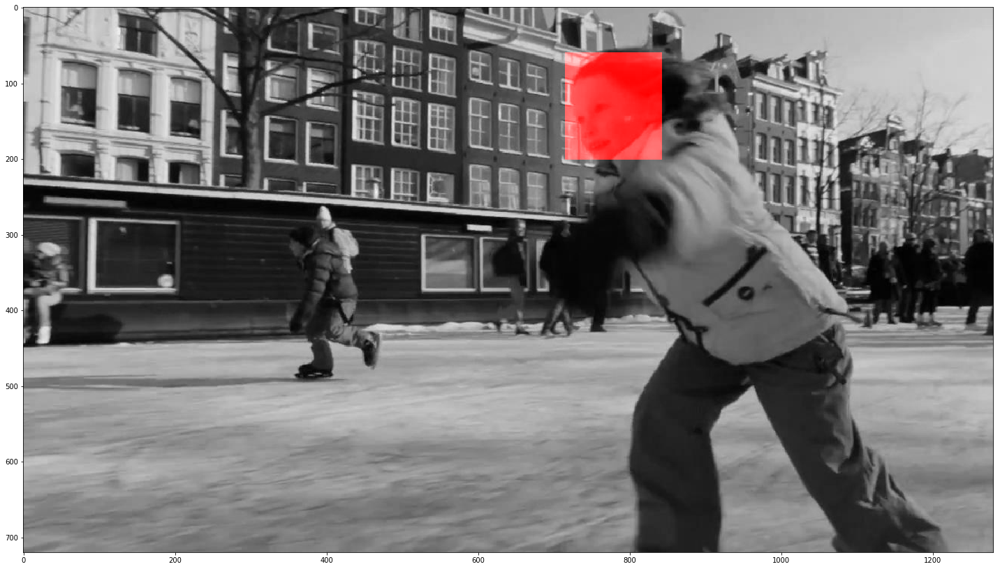

IndexError: single positional indexer is out-of-bounds

In [157]:
for i in range(0, int(alov300_df['size_z'][0]), 5):
    plt.figure(figsize=(20, 20))
    
    box_1 = bound_box.iloc[ i // 5]

    rr, cc = draw.rectangle(np.flip(np.round(box_1['v1']).astype(np.int), axis=0), 
                            np.flip(np.round(box_1['v3']).astype(np.int), axis=0))

    #rr, cc = draw.rectangle((30, 30), extent=(50, 50))

    f1 = io.imread(join('../', alov300_df['video_path'][0], '%08d.jpg' % (i + 1)))
    f1 = gray2rgb(rgb2gray(f1))

    f1[rr, cc, 0] = 1

    io.imshow(f1)

    plt.show()


In [2]:
train = pd.read_csv('../data/alov300++/alov300_train.csv')

In [3]:
train.columns

Index([u'video_path', u'category', u'ground_truth_path', u'size_x', u'size_y',
       u'size_z'],
      dtype='object')

(array([172.,  66.,  20.,   3.,   1.,   5.,   2.,   2.,   1.,   2.,   2.,
          2.,   0.,   2.,   1.,   0.,   0.,   0.,   0.,   1.]),
 array([  19. ,  316.8,  614.6,  912.4, 1210.2, 1508. , 1805.8, 2103.6,
        2401.4, 2699.2, 2997. , 3294.8, 3592.6, 3890.4, 4188.2, 4486. ,
        4783.8, 5081.6, 5379.4, 5677.2, 5975. ]),
 <a list of 20 Patch objects>)

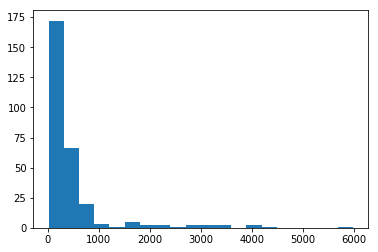

In [5]:
plt.hist(train['size_z'], bins=20)

In [7]:
np.sum(train['size_z']) / 5

27461

In [4]:
test = pd.read_csv('../data/alov300++/alov300_test.csv')

In [5]:
train.shape

(282, 6)

In [9]:
np.mean(train['size_z']) / 6 * 282

22884.333333333332

In [13]:
test.shape

(32, 6)

In [14]:
np.mean(test['size_z']) / 6 * 32

2391.8333333333335

In [15]:
np.sum(test['size_z'])/5

2870

In [12]:
set(test['video_path']) - set(train['video_path'])

{'input/ALOV300++/imagedata++/01-Light/01-Light_video00008',
 'input/ALOV300++/imagedata++/01-Light/01-Light_video00023',
 'input/ALOV300++/imagedata++/02-SurfaceCover/02-SurfaceCover_video00005',
 'input/ALOV300++/imagedata++/02-SurfaceCover/02-SurfaceCover_video00008',
 'input/ALOV300++/imagedata++/02-SurfaceCover/02-SurfaceCover_video00010',
 'input/ALOV300++/imagedata++/02-SurfaceCover/02-SurfaceCover_video00011',
 'input/ALOV300++/imagedata++/02-SurfaceCover/02-SurfaceCover_video00012',
 'input/ALOV300++/imagedata++/03-Specularity/03-Specularity_video00012',
 'input/ALOV300++/imagedata++/04-Transparency/04-Transparency_video00002',
 'input/ALOV300++/imagedata++/04-Transparency/04-Transparency_video00008',
 'input/ALOV300++/imagedata++/04-Transparency/04-Transparency_video00015',
 'input/ALOV300++/imagedata++/05-Shape/05-Shape_video00012',
 'input/ALOV300++/imagedata++/05-Shape/05-Shape_video00017',
 'input/ALOV300++/imagedata++/06-MotionSmoothness/06-MotionSmoothness_video00001',


In [11]:
set([4, 5]) - set([1, 3])

{4, 5}